In [1]:
import fastai
from fastai.vision import *
from fastai.callbacks import *
from fastai.vision.gan import *

In [2]:
torch.cuda.get_device_name()

'GeForce GTX 1060'

In [3]:
from pathlib import Path
path = Path('/home/rimijoker/Downloads/Compressed/the-oxfordiiit-pet-dataset')
path_hr = path/'images'
path_lr = path/'bnw'

In [4]:
path_hr.ls()

t-pet-dataset/images/scottish_terrier_1.jpg'),
 PosixPath('/home/rimijoker/Downloads/Compressed/the-oxfordiiit-pet-dataset/images/pug_91.jpg'),
 PosixPath('/home/rimijoker/Downloads/Compressed/the-oxfordiiit-pet-dataset/images/British_Shorthair_65.jpg'),
 PosixPath('/home/rimijoker/Downloads/Compressed/the-oxfordiiit-pet-dataset/images/wheaten_terrier_14.jpg'),
 PosixPath('/home/rimijoker/Downloads/Compressed/the-oxfordiiit-pet-dataset/images/Maine_Coon_266.jpg'),
 PosixPath('/home/rimijoker/Downloads/Compressed/the-oxfordiiit-pet-dataset/images/boxer_150.jpg'),
 PosixPath('/home/rimijoker/Downloads/Compressed/the-oxfordiiit-pet-dataset/images/Ragdoll_129.jpg'),
 PosixPath('/home/rimijoker/Downloads/Compressed/the-oxfordiiit-pet-dataset/images/wheaten_terrier_152.jpg'),
 PosixPath('/home/rimijoker/Downloads/Compressed/the-oxfordiiit-pet-dataset/images/Bombay_7.jpg'),
 PosixPath('/home/rimijoker/Downloads/Compressed/the-oxfordiiit-pet-dataset/images/pomeranian_182.jpg'),
 PosixPath('/ho

In [5]:
from bnw import *
il = ImageList.from_folder(path_hr)
parallel(bnw(path_lr, path_hr), il.items)

In [6]:
path_lr.ls()

/Downloads/Compressed/the-oxfordiiit-pet-dataset/bnw/german_shorthaired_102.jpg'),
 PosixPath('/home/rimijoker/Downloads/Compressed/the-oxfordiiit-pet-dataset/bnw/Siamese_75.jpg'),
 PosixPath('/home/rimijoker/Downloads/Compressed/the-oxfordiiit-pet-dataset/bnw/yorkshire_terrier_22.jpg'),
 PosixPath('/home/rimijoker/Downloads/Compressed/the-oxfordiiit-pet-dataset/bnw/american_bulldog_130.jpg'),
 PosixPath('/home/rimijoker/Downloads/Compressed/the-oxfordiiit-pet-dataset/bnw/scottish_terrier_173.jpg'),
 PosixPath('/home/rimijoker/Downloads/Compressed/the-oxfordiiit-pet-dataset/bnw/scottish_terrier_1.jpg'),
 PosixPath('/home/rimijoker/Downloads/Compressed/the-oxfordiiit-pet-dataset/bnw/pug_91.jpg'),
 PosixPath('/home/rimijoker/Downloads/Compressed/the-oxfordiiit-pet-dataset/bnw/British_Shorthair_65.jpg'),
 PosixPath('/home/rimijoker/Downloads/Compressed/the-oxfordiiit-pet-dataset/bnw/wheaten_terrier_14.jpg'),
 PosixPath('/home/rimijoker/Downloads/Compressed/the-oxfordiiit-pet-dataset/bnw/M

In [7]:
src = ImageImageList.from_folder(path_lr).split_by_rand_pct(0.1, seed=42)

In [8]:
def get_data(bs,size):
    data = (src.label_from_func(lambda x: path_hr/x.relative_to(path_lr))
           .transform(get_transforms(), size=size, tfm_y=True)
           .databunch(bs=bs, num_workers=1).normalize(imagenet_stats, do_y=True))

    data.c = 3
    return data

In [9]:
#bs,size=32, 128
#bs,size = 24,160
bs,size = 25, 128
arch = models.resnet18
data_gen = get_data(bs,size)

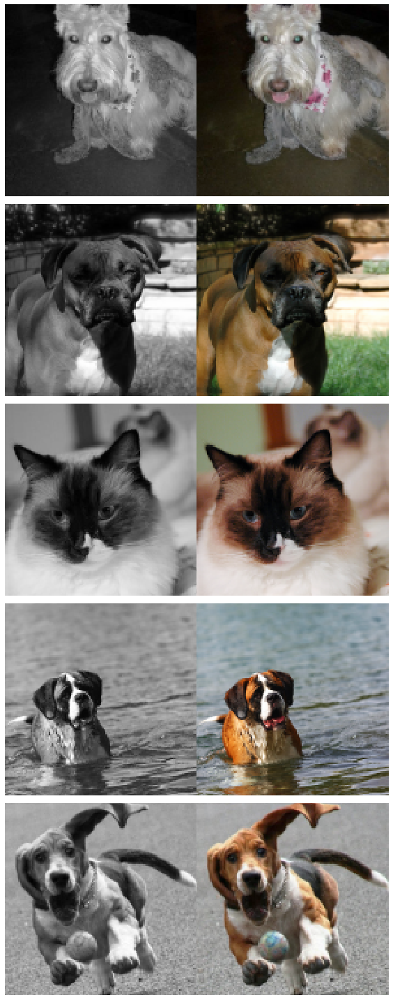

In [10]:
data_gen.show_batch()


In [18]:
wd = 1e-3
loss_gen = MSELossFlat()
from fastai.callbacks import SaveModelCallback, CSVLogger


In [19]:
from torchvision.models import vgg16_bn
def gram_matrix(x):
    n,c,h,w = x.size()
    x = x.view(n, c, -1)
    return (x @ x.transpose(1,2))/(c*h*w)
base_loss = F.l1_loss
vgg_m = vgg16_bn(True).features.cuda().eval()
requires_grad(vgg_m, False)

In [20]:
blocks = [i-1 for i,o in enumerate(children(vgg_m)) if isinstance(o,nn.MaxPool2d)]
blocks, [vgg_m[i] for i in blocks]
class FeatureLoss(nn.Module):
    def __init__(self, m_feat, layer_ids, layer_wgts):
        super().__init__()
        self.m_feat = m_feat
        self.loss_features = [self.m_feat[i] for i in layer_ids]
        self.hooks = hook_outputs(self.loss_features, detach=False)
        self.wgts = layer_wgts
        self.metric_names = ['pixel',] + [f'feat_{i}' for i in range(len(layer_ids))
              ] + [f'gram_{i}' for i in range(len(layer_ids))]

    def make_features(self, x, clone=False):
        self.m_feat(x)
        return [(o.clone() if clone else o) for o in self.hooks.stored]
    
    def forward(self, input, target):
        out_feat = self.make_features(target, clone=True)
        in_feat = self.make_features(input)
        self.feat_losses = [base_loss(input,target)]
        self.feat_losses += [base_loss(f_in, f_out)*w
                             for f_in, f_out, w in zip(in_feat, out_feat, self.wgts)]
        self.feat_losses += [base_loss(gram_matrix(f_in), gram_matrix(f_out))*w**2 * 5e3
                             for f_in, f_out, w in zip(in_feat, out_feat, self.wgts)]
        self.metrics = dict(zip(self.metric_names, self.feat_losses))
        return sum(self.feat_losses)
    
    def __del__(self): self.hooks.remove()
feat_loss = FeatureLoss(vgg_m, blocks[2:5], [5,15,2])

In [21]:
wd = 1e-3
def create_gen_learner():
    return unet_learner(data_gen, arch, norm_type=NormType.Weight, wd=wd,
                         self_attention=True, loss_func=feat_loss, callback_fns=[CSVLogger])

In [22]:
learn_gen = create_gen_learner()

In [23]:
learn_gen.model.cuda()

DynamicUnet(
  (layers): ModuleList(
    (0): Sequential(
      (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
      (3): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (4): Sequential(
        (0): BasicBlock(
          (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (relu): ReLU(inplace=True)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        )
        (1): BasicBlock(
          (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn1): BatchNorm2d(64, eps=1e-05

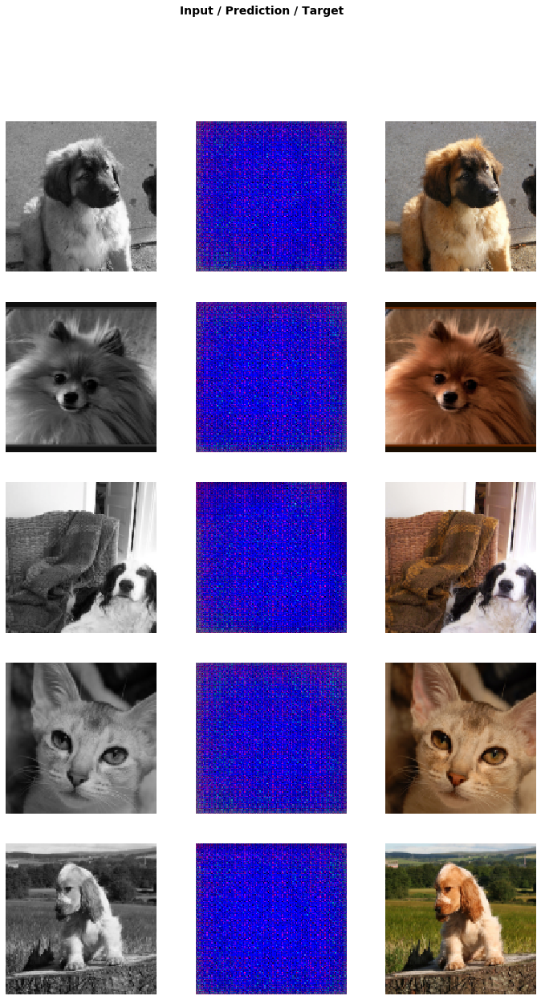

In [25]:
learn_gen.show_results(5)

In [26]:
#learn_gen.load('genpre1')
learn_gen.lr_find()

epoch,train_loss,valid_loss,time


LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


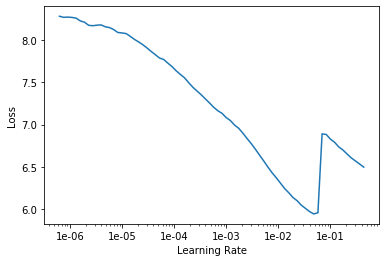

In [27]:
learn_gen.recorder.plot()

In [28]:
learn_gen.fit_one_cycle(10, slice(1e-5, 1e-3),pct_start=0.3, callbacks=[SaveModelCallback(learn_gen, every='improvement', monitor='valid_loss', name='genpre128')])

epoch,train_loss,valid_loss,time
0,3.395452,3.175981,03:38
1,3.024985,3.070512,04:26
2,2.908221,2.965917,04:33
3,2.833362,2.854572,03:32
4,2.762779,2.800662,03:31
5,2.701458,2.724119,03:26
6,2.644667,2.666272,03:20
7,2.615446,2.638171,03:20
8,2.586066,2.621139,03:18
9,2.554911,2.615430,03:23


Better model found at epoch 0 with valid_loss value: 3.175980567932129.
Better model found at epoch 1 with valid_loss value: 3.070512056350708.
Better model found at epoch 2 with valid_loss value: 2.9659173488616943.
Better model found at epoch 3 with valid_loss value: 2.854571580886841.
Better model found at epoch 4 with valid_loss value: 2.8006622791290283.
Better model found at epoch 5 with valid_loss value: 2.724118709564209.
Better model found at epoch 6 with valid_loss value: 2.666271924972534.
Better model found at epoch 7 with valid_loss value: 2.638171434402466.
Better model found at epoch 8 with valid_loss value: 2.6211392879486084.
Better model found at epoch 9 with valid_loss value: 2.6154303550720215.


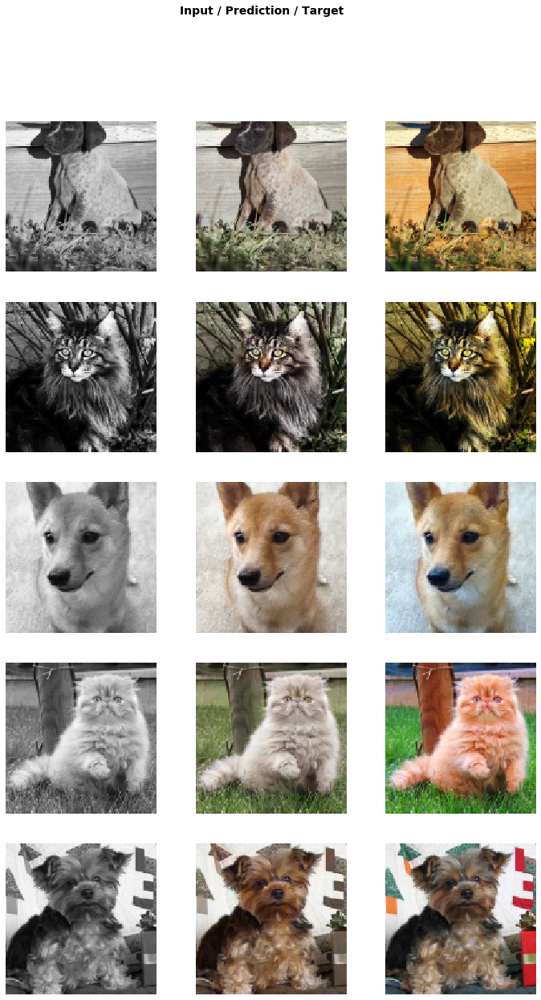

In [29]:
learn_gen.show_results()

In [30]:
learn_gen.save('genpre128')

epoch,train_loss,valid_loss,time


LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


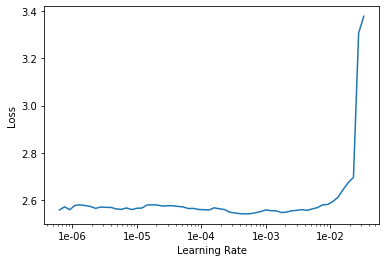

In [31]:
learn_gen.lr_find()
learn_gen.recorder.plot()

In [32]:
learn_gen.fit_one_cycle(10, slice(1e-5, 1e-3),pct_start=0.3, callbacks=[SaveModelCallback(learn_gen, every='improvement', monitor='valid_loss', name='genpre128')])

epoch,train_loss,valid_loss,time
0,2.571240,2.632357,03:26
1,2.638526,2.704201,04:14
2,2.640902,2.679746,04:35
3,2.629532,2.680863,04:36
4,2.593800,2.641563,04:57
5,2.565028,2.617314,04:54
6,2.516063,2.591846,04:53
7,2.494508,2.562955,04:56
8,2.456036,2.552258,04:53
9,2.434675,2.548525,04:51


Better model found at epoch 0 with valid_loss value: 2.632357358932495.
Better model found at epoch 5 with valid_loss value: 2.6173136234283447.
Better model found at epoch 6 with valid_loss value: 2.5918455123901367.
Better model found at epoch 7 with valid_loss value: 2.5629546642303467.
Better model found at epoch 8 with valid_loss value: 2.552258253097534.
Better model found at epoch 9 with valid_loss value: 2.548525094985962.


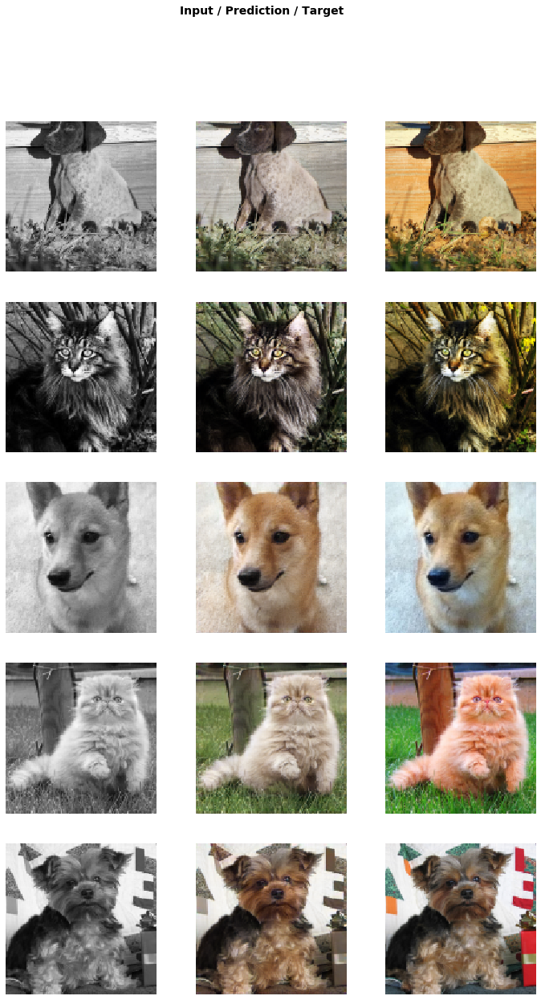

In [33]:
learn_gen.show_results()

epoch,train_loss,valid_loss,time


LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


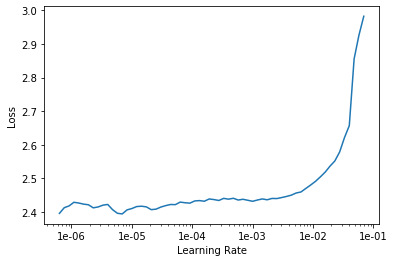

In [34]:
learn_gen.lr_find()
learn_gen.recorder.plot()

In [38]:
learn_gen.fit_one_cycle(10, slice(1e-6),pct_start=0.3, callbacks=[SaveModelCallback(learn_gen, every='improvement', monitor='valid_loss', name='genpre128')])

epoch,train_loss,valid_loss,time
0,2.435960,2.548166,03:31
1,2.457258,2.549509,04:22
2,2.447578,2.548639,04:40
3,2.447641,2.547966,04:49
4,2.423288,2.548729,04:47
5,2.440144,2.548322,04:51
6,2.452380,2.546990,04:45
7,2.420755,2.547549,04:57
8,2.447434,2.547186,04:43
9,2.445524,2.547237,04:57


Better model found at epoch 0 with valid_loss value: 2.548166036605835.
Better model found at epoch 3 with valid_loss value: 2.547966480255127.
Better model found at epoch 6 with valid_loss value: 2.546989917755127.


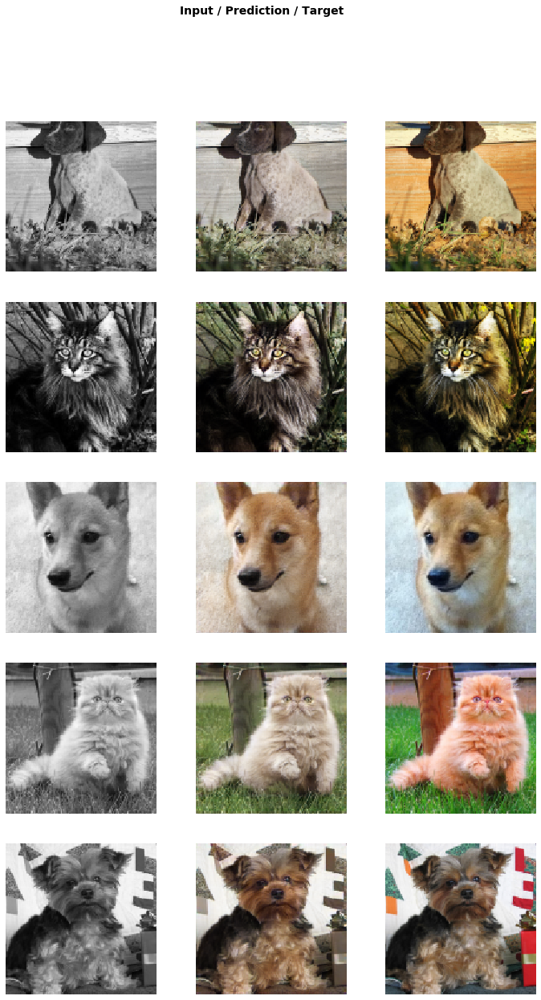

In [39]:
learn_gen.show_results()

epoch,train_loss,valid_loss,time


LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


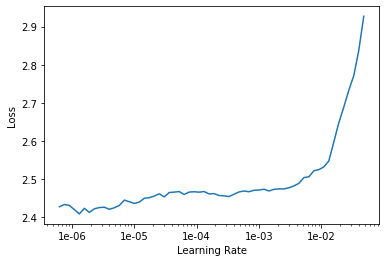

In [41]:
learn_gen.lr_find()
learn_gen.recorder.plot()

In [44]:
learn_gen.load('genpre128')
learn_gen.fit_one_cycle(3, slice(1e-7),pct_start=0.3, callbacks=[SaveModelCallback(learn_gen, every='improvement', monitor='valid_loss', name='genpre128')])

epoch,train_loss,valid_loss,time
0,2.444202,2.549399,04:04
1,2.446565,2.547087,05:11
2,2.443401,2.547700,05:17


Better model found at epoch 0 with valid_loss value: 2.5493993759155273.
Better model found at epoch 1 with valid_loss value: 2.5470871925354004.


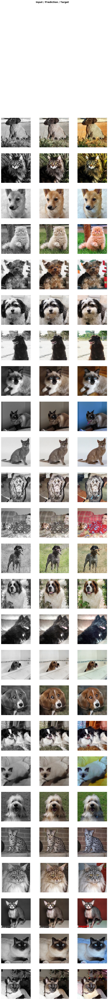

In [45]:
learn_gen.show_results(rows=25)

In [46]:
learn_gen.save('genfinal128')

In [47]:
name_gen = 'image_gen'
path_gen = Path(path/name_gen)

In [48]:
path_gen.mkdir(exist_ok=True)

In [49]:
def save_preds(dl):
    i=0
    names = dl.dataset.items
    
    for b in dl:
        preds = learn_gen.pred_batch(batch=b, reconstruct=True)
        for o in preds:
            o.save(path_gen/names[i].name)
            i += 1

In [50]:
save_preds(data_gen.fix_dl)

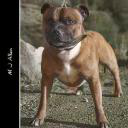

In [51]:
PIL.Image.open(path_gen.ls()[9])

In [52]:
learn_gen=None
gc.collect()

161325

In [53]:
path_gen.ls()

/rimijoker/Downloads/Compressed/the-oxfordiiit-pet-dataset/image_gen/wheaten_terrier_141.jpg'),
 PosixPath('/home/rimijoker/Downloads/Compressed/the-oxfordiiit-pet-dataset/image_gen/Sphynx_72.jpg'),
 PosixPath('/home/rimijoker/Downloads/Compressed/the-oxfordiiit-pet-dataset/image_gen/chihuahua_169.jpg'),
 PosixPath('/home/rimijoker/Downloads/Compressed/the-oxfordiiit-pet-dataset/image_gen/yorkshire_terrier_156.jpg'),
 PosixPath('/home/rimijoker/Downloads/Compressed/the-oxfordiiit-pet-dataset/image_gen/english_cocker_spaniel_51.jpg'),
 PosixPath('/home/rimijoker/Downloads/Compressed/the-oxfordiiit-pet-dataset/image_gen/great_pyrenees_106.jpg'),
 PosixPath('/home/rimijoker/Downloads/Compressed/the-oxfordiiit-pet-dataset/image_gen/american_pit_bull_terrier_120.jpg'),
 PosixPath('/home/rimijoker/Downloads/Compressed/the-oxfordiiit-pet-dataset/image_gen/american_pit_bull_terrier_161.jpg'),
 PosixPath('/home/rimijoker/Downloads/Compressed/the-oxfordiiit-pet-dataset/image_gen/Bengal_88.jpg'),

In [54]:
def get_crit_data(classes, bs, size):
    src = ImageList.from_folder(path, include=classes).split_by_rand_pct(0.1, seed=42)
    ll = src.label_from_folder(classes=classes)
    data = (ll.transform(get_transforms(), size=size)
           .databunch(bs=bs).normalize(imagenet_stats))
    data.c = 3
    return data

In [55]:
data_crit = get_crit_data(['images', name_gen], bs=bs, size=size)

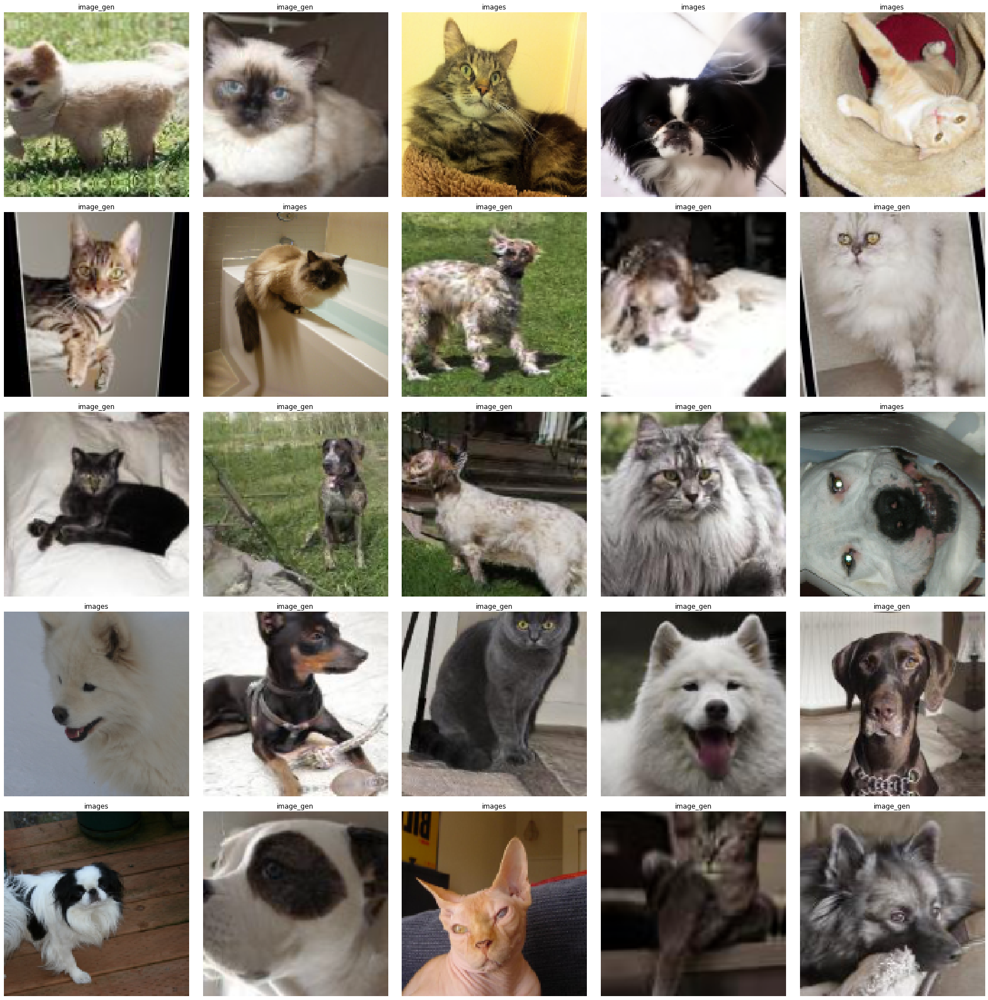

In [56]:
data_crit.show_batch(rows=8, ds_type=DatasetType.Train, imgsize=5)

In [57]:
data_crit

ImageDataBunch;

Train: LabelList (13222 items)
x: ImageList
Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128)
y: CategoryList
images,images,images,images,images
Path: /home/rimijoker/Downloads/Compressed/the-oxfordiiit-pet-dataset;

Valid: LabelList (1469 items)
x: ImageList
Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128)
y: CategoryList
image_gen,image_gen,images,images,image_gen
Path: /home/rimijoker/Downloads/Compressed/the-oxfordiiit-pet-dataset;

Test: None

In [58]:
loss_critic = AdaptiveLoss(nn.BCEWithLogitsLoss())

In [59]:
def create_critic_learner(data, metrics):
    return Learner(data, gan_critic(), metrics=metrics, loss_func=loss_critic)

In [60]:
learn_critic = create_critic_learner(data_crit, accuracy_thresh_expand)

In [65]:
learn_critic.lr_find()

epoch,train_loss,valid_loss,accuracy_thresh_expand,time


LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


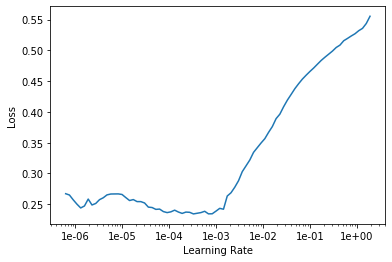

In [66]:
learn_critic.recorder.plot()

In [68]:
learn_critic.fit_one_cycle(4, slice(1e-5))

epoch,train_loss,valid_loss,accuracy_thresh_expand,time
0,0.223299,0.211636,0.914881,09:49
1,0.219531,0.204239,0.918421,10:45
2,0.225019,0.202096,0.920000,10:50
3,0.223705,0.200377,0.920572,10:45


In [70]:
learn_critic.save('critic-final')

In [18]:
learn_crit=None
learn_gen=None
gc.collect()

22250

In [19]:
data_crit = get_crit_data(['bnw', 'images'], bs=bs//20, size=size)
learn_crit = create_critic_learner(data_crit, metrics=None).load('critic-pre128')
learn_gen = create_gen_learner().load('genpre1')

In [20]:
switcher = partial(AdaptiveGANSwitcher, critic_thresh=0.65)
learn = GANLearner.from_learners(learn_gen, learn_crit, weights_gen=(1.,50.), show_img=True, switcher=switcher,
                                 opt_func=partial(optim.Adam, betas=(0.,0.99)), wd=wd)
learn.callback_fns.append(partial(GANDiscriminativeLR, mult_lr=5.))

In [21]:
learn.model.cuda()

GANModule(
  (generator): DynamicUnet(
    (layers): ModuleList(
      (0): Sequential(
        (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
        (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (2): ReLU(inplace=True)
        (3): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
        (4): Sequential(
          (0): BasicBlock(
            (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
            (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
            (relu): ReLU(inplace=True)
            (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
            (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          )
          (1): BasicBlock(
            (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 

In [22]:
learn.lr_find()

epoch,train_loss,valid_loss,gen_loss,disc_loss,time


LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


RuntimeError: CUDA out of memory. Tried to allocate 900.00 MiB (GPU 0; 5.93 GiB total capacity; 3.76 GiB already allocated; 912.94 MiB free; 3.98 GiB reserved in total by PyTorch)

In [23]:
learn.recorder.plot()

ValueError: x and y must have same first dimension, but have shapes (35,) and (34,)

In [ ]:
learn.fit(10)